# Importar Datos

In [2]:
import pandas as pd
train_set = pd.read_csv('training.csv',index_col='id')
test_set = pd.read_csv('test.csv')
train_labels= pd.read_csv('training_labels.csv', index_col='id')


In [4]:
train_set.head(5)

,amount_tsh,date_recorded,funder,gps_height,installer,longitude,latitude,wpt_name,num_private,basin,...,payment_type,water_quality,quality_group,quantity,quantity_group,source,source_type,source_class,waterpoint_type,waterpoint_type_group
id,,,,,,,,,,,,,,,,,,,,,
69572,6000.0,2011-03-14,Roman,1390,Roman,34.938093,-9.856322,none,0,Lake Nyasa,...,annually,soft,good,enough,enough,spring,spring,groundwater,communal standpipe,communal standpipe
8776,0.0,2013-03-06,Grumeti,1399,GRUMETI,34.698766,-2.147466,Zahanati,0,Lake Victoria,...,never pay,soft,good,insufficient,insufficient,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe
34310,25.0,2013-02-25,Lottery Club,686,World vision,37.460664,-3.821329,Kwa Mahundi,0,Pangani,...,per bucket,soft,good,enough,enough,dam,dam,surface,communal standpipe multiple,communal standpipe
67743,0.0,2013-01-28,Unicef,263,UNICEF,38.486161,-11.155298,Zahanati Ya Nanyumbu,0,Ruvuma / Southern Coast,...,never pay,soft,good,dry,dry,machine dbh,borehole,groundwater,communal standpipe multiple,communal standpipe
19728,0.0,2011-07-13,Action In A,0,Artisan,31.130847,-1.825359,Shuleni,0,Lake Victoria,...,never pay,soft,good,seasonal,seasonal,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe


In [6]:
test_set.head(5)

,id,amount_tsh,date_recorded,funder,gps_height,installer,longitude,latitude,wpt_name,num_private,...,payment_type,water_quality,quality_group,quantity,quantity_group,source,source_type,source_class,waterpoint_type,waterpoint_type_group
0,50785,0.0,2013-02-04,Dmdd,1996,DMDD,35.290799,-4.059696,Dinamu Secondary School,0,...,never pay,soft,good,seasonal,seasonal,rainwater harvesting,rainwater harvesting,surface,other,other
1,51630,0.0,2013-02-04,Government Of Tanzania,1569,DWE,36.656709,-3.309214,Kimnyak,0,...,never pay,soft,good,insufficient,insufficient,spring,spring,groundwater,communal standpipe,communal standpipe
2,17168,0.0,2013-02-01,NaN,1567,NaN,34.767863,-5.004344,Puma Secondary,0,...,never pay,soft,good,insufficient,insufficient,rainwater harvesting,rainwater harvesting,surface,other,other
3,45559,0.0,2013-01-22,Finn Water,267,FINN WATER,38.058046,-9.418672,Kwa Mzee Pange,0,...,unknown,soft,good,dry,dry,shallow well,shallow well,groundwater,other,other
4,49871,500.0,2013-03-27,Bruder,1260,BRUDER,35.006123,-10.950412,Kwa Mzee Turuka,0,...,monthly,soft,good,enough,enough,spring,spring,groundwater,communal standpipe,communal standpipe


In [7]:
train_labels.head(5)

,status_group
id,
69572,functional
8776,functional
34310,functional
67743,non functional
19728,functional


# Concatenar train y test

In [8]:
dataset = pd.concat([train_set, test_set], sort=False)

In [10]:
dataset.head(5)

,amount_tsh,date_recorded,funder,gps_height,installer,longitude,latitude,wpt_name,num_private,basin,...,water_quality,quality_group,quantity,quantity_group,source,source_type,source_class,waterpoint_type,waterpoint_type_group,id
69572,6000.0,2011-03-14,Roman,1390,Roman,34.938093,-9.856322,none,0,Lake Nyasa,...,soft,good,enough,enough,spring,spring,groundwater,communal standpipe,communal standpipe,NaN
8776,0.0,2013-03-06,Grumeti,1399,GRUMETI,34.698766,-2.147466,Zahanati,0,Lake Victoria,...,soft,good,insufficient,insufficient,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe,NaN
34310,25.0,2013-02-25,Lottery Club,686,World vision,37.460664,-3.821329,Kwa Mahundi,0,Pangani,...,soft,good,enough,enough,dam,dam,surface,communal standpipe multiple,communal standpipe,NaN
67743,0.0,2013-01-28,Unicef,263,UNICEF,38.486161,-11.155298,Zahanati Ya Nanyumbu,0,Ruvuma / Southern Coast,...,soft,good,dry,dry,machine dbh,borehole,groundwater,communal standpipe multiple,communal standpipe,NaN
19728,0.0,2011-07-13,Action In A,0,Artisan,31.130847,-1.825359,Shuleni,0,Lake Victoria,...,soft,good,seasonal,seasonal,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe,NaN


# Variable objetivo

<AxesSubplot: >

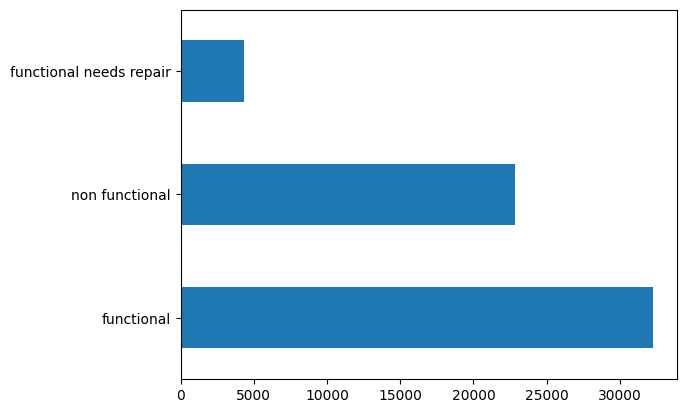

In [14]:
import seaborn as sns
train_labels.status_group.value_counts().plot(kind='barh')

Están desbalanceados los datos.

# Reporte descriptivo

In [17]:
import pandas_profiling
pandas_profiling.ProfileReport(dataset)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

# Eliminar Variables 

Elimino la columna id

In [20]:
dataset.drop(columns=["id"], inplace=True)

Las 18 variables a eliminar

In [21]:
eliminar=['wpt_name', 'num_private', 'subvillage', 'region_code', 'district_code', 'lga', 'ward', 
          'recorded_by', 'scheme_name', 'extraction_type_group', 'extraction_type_class', 
          'management_group', 'payment', 'quality_group', 'quantity_group', 'source_class',
        'source_type', 'waterpoint_type_group']

Bucle for para eliminar las variables seleccionadas

In [22]:
dataset.shape[1]

39

In [26]:
for i in eliminar:
    dataset= dataset.drop([i], axis=1)

In [27]:
dataset.shape[1]

21

# Transformación de variables

In [28]:
dataset.isnull().sum()

amount_tsh              0
date_recorded           0
funder               4504
gps_height              0
installer            4532
longitude               0
latitude                0
basin                   0
region                  0
population              0
public_meeting       4155
scheme_management    4846
permit               3793
construction_year       0
extraction_type         0
management              0
payment_type            0
water_quality           0
quantity                0
source                  0
waterpoint_type         0
dtype: int64

#### funder

Sustituyo los valores nulos por 'Other'

In [30]:
dataset["funder"].fillna(value="Other", inplace=True)

Paso los valores de funder que aparecen igual o menos de cien veces a 'Other' también

In [36]:
funder_counts = dataset["funder"].value_counts()
otros_funders = funder_counts[funder_counts <= 100].index.tolist()
dataset.loc[dataset['funder'].isin(otros_funders), 'funder'] = 'Other'
print(dataset['funder'].value_counts())

Other                     18976
Government Of Tanzania    11299
Danida                     3907
Hesawa                     2782
Rwssp                      1703
                          ...  
Undp                        103
Rc Ch                       103
Missi                       102
Gtz                         102
H                           102
Name: funder, Length: 102, dtype: int64


In [29]:
(dataset == 0).sum()

amount_tsh           52049
date_recorded            0
funder                   0
gps_height           25649
installer                0
longitude             2269
latitude                 0
basin                    0
region                   0
population           26834
public_meeting        6346
scheme_management        0
permit               21851
construction_year    25969
extraction_type          0
management               0
payment_type             0
water_quality            0
quantity                 0
source                   0
waterpoint_type          0
dtype: int64

El 0 está mal registrado, lo paso a Other también

In [46]:
dataset["funder"].replace({"0": "Other"}, inplace=True)


#### installer

Hago los mismo con installer y las demás variables con las mismas características

In [49]:
dataset["installer"].fillna(value="Unknown", inplace=True)
dataset["installer"].replace("0", "Unknown", inplace=True)

In [50]:
installer_count = dataset["installer"].value_counts()
replace_installer = installer_count[installer_count <= 100].index
dataset["installer"].replace(replace_installer, "Other", inplace=True)


#### public_meeting

In [51]:
dataset["public_meeting"].fillna(value=dataset["public_meeting"].mode()[0], inplace = True)

#### permit

In [52]:
dataset["permit"].fillna(value=dataset["permit"].mode()[0], inplace = True)

#### scheme_management

In [53]:
dataset["scheme_management"].fillna(value="Unknown", inplace=True)
dataset["scheme_management"].replace("None","Unknown", inplace=True)

#### construction_year

In [54]:
dataset["construction_year"].value_counts()

0       25969
2010     3314
2008     3243
2009     3196
2000     2578
2007     1960
2006     1892
2011     1591
2003     1579
2004     1417
2012     1347
2002     1343
1995     1283
2005     1275
1978     1267
1999     1222
1998     1190
1985     1177
1990     1176
1996     1020
1980     1005
1984      970
1994      940
1982      926
1972      892
1997      821
1974      814
1992      807
1993      745
2001      680
1988      657
1983      594
1975      561
1986      553
1976      525
1970      493
1991      407
1989      396
1987      370
1981      291
1977      247
1979      245
1973      227
2013      209
1971      177
1960      124
1963      107
1967      106
1968       93
1969       77
1964       48
1962       36
1961       28
1965       21
1966       19
Name: construction_year, dtype: int64

In [55]:
dataset["construction_year"].replace(0, np.nan, inplace=True)

Imputo los valores faltantes de construction_year por la media

In [56]:
dataset["construction_year"].fillna(value=dataset["construction_year"].mean(), inplace=True)

#### population

{'whiskers': [<matplotlib.lines.Line2D at 0x2c4d038f7f0>,
 'caps': [<matplotlib.lines.Line2D at 0x2c4d0378d30>,
 'boxes': [<matplotlib.lines.Line2D at 0x2c4d038ffd0>],
 'medians': [<matplotlib.lines.Line2D at 0x2c4d0378040>],
 'fliers': [<matplotlib.lines.Line2D at 0x2c4d02ac340>],
 'means': []}

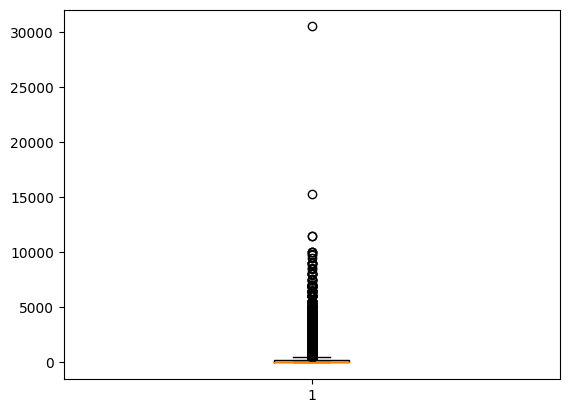

In [57]:
plt.boxplot(dataset["population"])

 Cualquier valor que sea mayor que 12000 será reemplazado por 12000, para eliminar los valores extremos

In [58]:
dataset["population"].clip(upper=12000, inplace=True)

#### month_recorded

In [59]:
from datetime import datetime

In [60]:
dataset["month_recorded"] = (dataset["date_recorded"].apply(lambda x: (datetime.strptime(x, "%Y-%m-%d").month))).apply(str)
dataset["month_recorded"].head()

69572    3
8776     3
34310    2
67743    1
19728    7
Name: month_recorded, dtype: object

#### year_recorded

In [61]:
dataset["year_recorded"] = (dataset["date_recorded"].apply(lambda x: (datetime.strptime(x, "%Y-%m-%d").year))).apply(str)
dataset["year_recorded"].head()

69572    2011
8776     2013
34310    2013
67743    2013
19728    2011
Name: year_recorded, dtype: object

In [62]:
dataset.drop(columns=["date_recorded"], inplace=True)

In [63]:
dataset["well_existence"] = 2019 - dataset["construction_year"]
dataset["well_existence"].head()

69572    20.000000
8776      9.000000
34310    10.000000
67743    33.000000
19728    22.129057
Name: well_existence, dtype: float64

# Dummies

In [64]:
dataset = pd.get_dummies(dataset)

In [65]:
train_clean = dataset[0:59400]

In [66]:
test_clean = dataset[59400::]

# Modelo 1

In [67]:
from sklearn import datasets, linear_model
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import GridSearchCV

In [68]:
logreg = LogisticRegression()

logreg.fit(train_clean, train_labels)

C:\Users\Kim\anaconda3\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\Kim\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


LogisticRegression()

In [69]:
param_grid = {"C": [0.001, 0.01, 0.1, 1, 10, 100, 1000]}
clf = GridSearchCV(LogisticRegression(), param_grid)

In [70]:

gridsearch = GridSearchCV(
    cv=5,
    estimator=LogisticRegression(
        C=1.0,
        intercept_scaling=1,
        dual=False,
        fit_intercept=True,
        tol=0.0001,
    ),
    param_grid={"C": [0.001, 0.01, 0.1, 1, 10, 100, 1000]},
)

In [71]:
regression = gridsearch.fit(train_clean, train_labels)

C:\Users\Kim\anaconda3\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\Kim\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
C:\Users\Kim\anaconda3\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ra

C:\Users\Kim\anaconda3\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\Kim\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
C:\Users\Kim\anaconda3\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ra

C:\Users\Kim\anaconda3\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\Kim\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
C:\Users\Kim\anaconda3\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ra

C:\Users\Kim\anaconda3\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\Kim\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
C:\Users\Kim\anaconda3\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ra

In [72]:
optimized_regression = LogisticRegression(C=regression.best_estimator_.get_params()['C'])
optimized_regression.fit(train_clean, train_labels)

C:\Users\Kim\anaconda3\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\Kim\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


LogisticRegression(C=1000)

# Modelo 2

In [73]:
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.metrics import classification_report
from sklearn.model_selection import GridSearchCV

In [74]:
idtest = test_set["id"]

In [75]:
baseline = GradientBoostingClassifier(
    learning_rate=0.1,
    n_estimators=100,
    max_depth=3,
    min_samples_split=2,
    min_samples_leaf=1,
    subsample=1,
    max_features="sqrt",
    random_state=10,
)

In [76]:
baseline.fit(train_clean, train_labels)

C:\Users\Kim\anaconda3\lib\site-packages\sklearn\ensemble\_gb.py:437: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


GradientBoostingClassifier(max_features='sqrt', random_state=10, subsample=1)

In [77]:
predictors = list(train_clean)

In [78]:
feat_imp = pd.Series(baseline.feature_importances_, predictors).sort_values(
    ascending=False)

In [79]:
preds = baseline.predict(test_clean)

# Modelo 3

In [80]:
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.model_selection import GridSearchCV

In [81]:
RFCparams = {
    "n_estimators": [600, 700, 900],
    "max_depth": [30, 31, 32], 
}

In [82]:
mod = RandomForestClassifier()

In [83]:
RFCmod = GridSearchCV(mod, RFCparams, cv=3, n_jobs=-1)

In [84]:
RFCmod.fit(train_clean, train_labels)cvbg

C:\Users\Kim\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:909: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  self.best_estimator_.fit(X, y, **fit_params)


GridSearchCV(cv=3, estimator=RandomForestClassifier(), n_jobs=-1,
             param_grid={'max_depth': [30, 31, 32],
                         'n_estimators': [600, 700, 900]})

In [85]:
RFCmod.best_params_

{'max_depth': 30, 'n_estimators': 900}

In [86]:
preds = RFCmod.predict(test_clean)

In [87]:
idtest = test_set["id"]

In [88]:
submission = pd.DataFrame(data=preds, index=idtest, columns=["status_group"])

In [89]:
submission.head()

,status_group
id,
50785,functional
51630,functional
17168,functional
45559,non functional
49871,functional


# Pycaret

In [123]:
import pycaret
from pycaret.classification import *

In [124]:
model_setup = setup(data=train_clean, target=train_labels, session_id=1)

,Description,Value
0,Session id,1
1,Target,year_recorded_2013
2,Target type,Binary
3,Original data shape,"(59400, 342)"
4,Transformed data shape,"(59400, 342)"
5,Transformed train set shape,"(41580, 342)"
6,Transformed test set shape,"(17820, 342)"
7,Numeric features,339
8,Preprocess,True
9,Imputation type,simple


In [126]:
model_rf = create_model('rf')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9998,1.0000,1.0000,0.9994,0.9997,0.9995,0.9995
1,0.9990,1.0000,1.0000,0.9977,0.9988,0.9980,0.9980
2,0.9998,1.0000,1.0000,0.9994,0.9997,0.9995,0.9995
3,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
4,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
5,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
6,0.9998,1.0000,1.0000,0.9994,0.9997,0.9995,0.9995
7,0.9998,1.0000,1.0000,0.9994,0.9997,0.9995,0.9995
8,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

In [127]:
print(model_rf)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='sqrt',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_samples_leaf=1,
                       min_samples_split=2, min_weight_fraction_leaf=0.0,
                       n_estimators=100, n_jobs=-1, oob_score=False,
                       random_state=1, verbose=0, warm_start=False)


In [129]:
tune_model_rf = tune_model(model_rf)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
1,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
2,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
3,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
4,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
5,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
6,0.9998,0.9998,1.0000,0.9994,0.9997,0.9995,0.9995
7,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
8,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


In [130]:
print(tune_model_rf)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0,
                       class_weight='balanced_subsample', criterion='entropy',
                       max_depth=4, max_features=1.0, max_leaf_nodes=None,
                       max_samples=None, min_impurity_decrease=0.0001,
                       min_samples_leaf=2, min_samples_split=10,
                       min_weight_fraction_leaf=0.0, n_estimators=90, n_jobs=-1,
                       oob_score=False, random_state=1, verbose=0,
                       warm_start=False)
